In [1]:
from collections import defaultdict
from glob import glob
import os

import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns


%matplotlib inline

In [2]:
plt.style.use('seaborn-white')
import matplotlib as mpl

mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)
mpl.rc('axes', titlesize=12)
mpl.rc('legend', fontsize=8)


In [3]:
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot, plot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

In [4]:
from selene_sdk.sequences import Genome
genome = Genome('/mnt/ceph/users/kchen/brownbag_demo/hg19_UCSC.fa')

In [5]:
df = pd.read_csv('./summer_project/std_mean_tables.csv', index_col=0)
df.head()

,sequence class,chrom,mean,std
0,E5 B-cell-like,chr1,-0.000467,0.150557
1,E7 Monocyte / Macrophage,chr1,0.000078,0.156104
2,E11 T-cell,chr1,0.000331,0.135609
3,E12 Erythroblast-like,chr1,-0.000840,0.228935
4,E1 Stem cell,chr1,0.000765,0.143983


In [6]:
df[df.columns[-2]]

0     -0.000467
1      0.000078
2      0.000331
3     -0.000840
4      0.000765
         ...   
875   -0.000416
876    0.001487
877   -0.000878
878    0.002364
879    0.001125
Name:  mean, Length: 880, dtype: float64

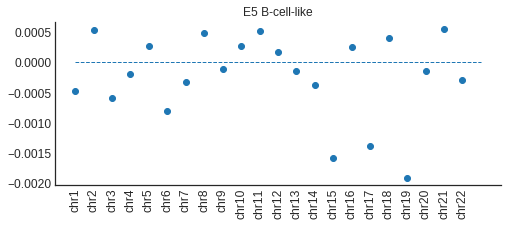

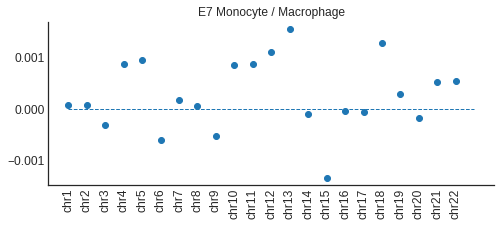

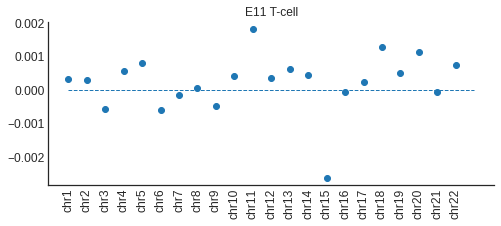

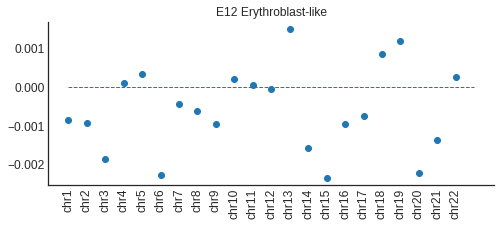

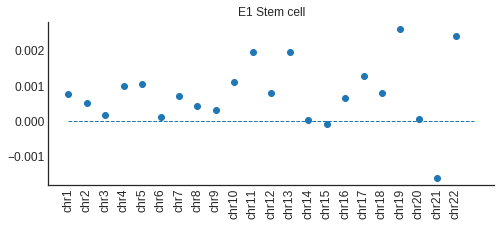

...

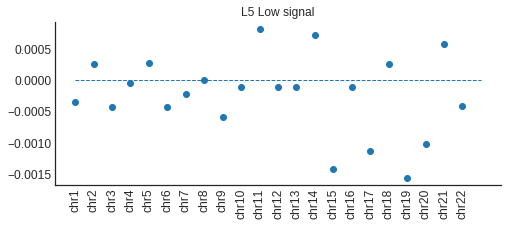

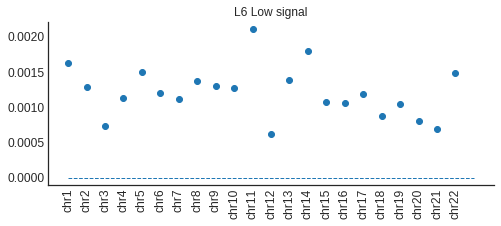

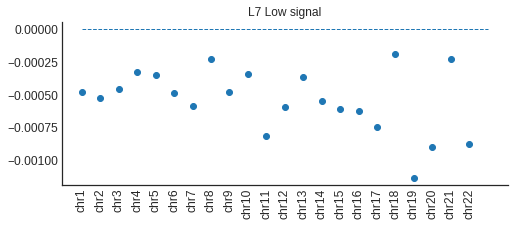

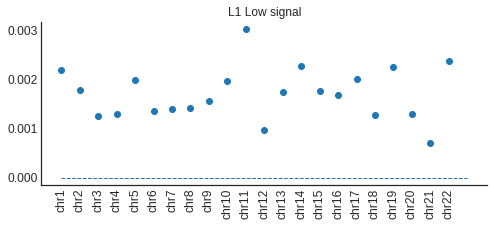

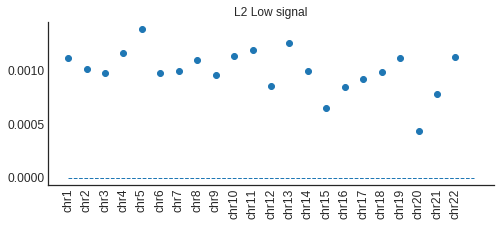

In [7]:
for sc in df['sequence class'].unique():
    subset_df = df[df['sequence class'] == sc]
    plt.figure(figsize=(8, 3))
    plt.scatter(
        list(range(len(subset_df))),
        subset_df[df.columns[-2]].values,)
    #plt.errorbar(
    #    list(range(len(subset_df))),
    #    subset_df[df.columns[-2]].values,
    #    subset_df[df.columns[-1]].values,
    #    linestyle='None', marker='o')
    plt.plot([0, 22], [0, 0], linestyle='--', linewidth=1)
    plt.title(sc)
    plt.xticks(list(range(len(subset_df))),
               subset_df['chrom'].values,
               rotation='vertical')
    plt.show()

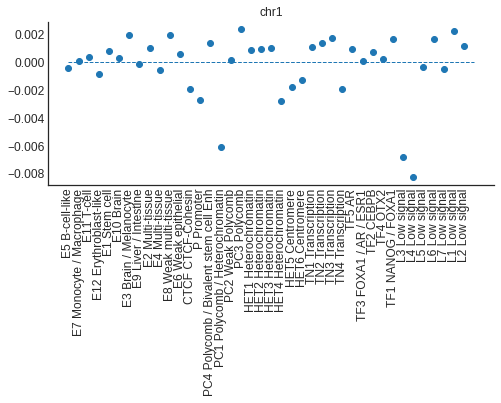

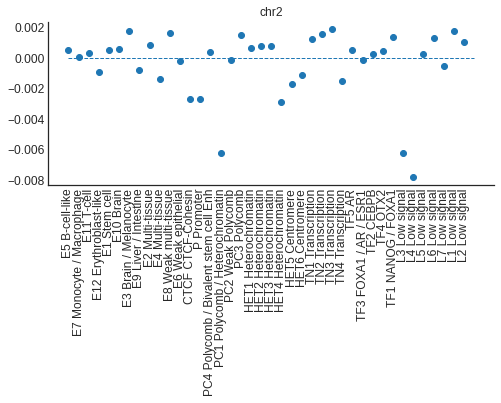

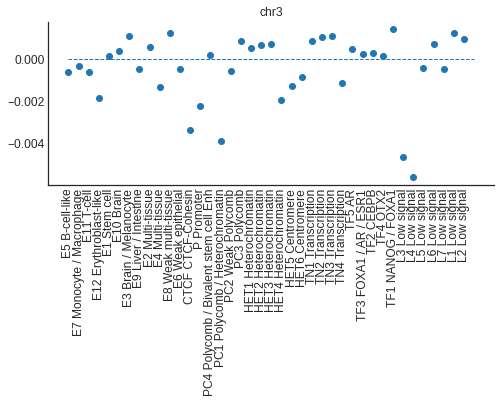

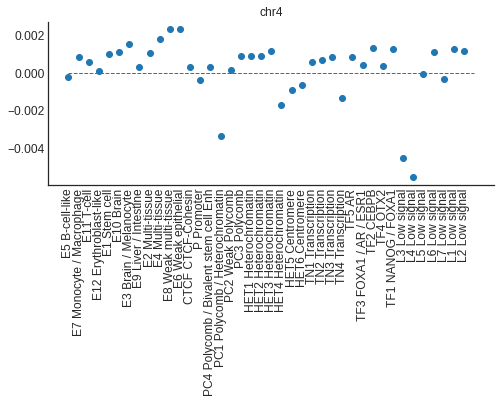

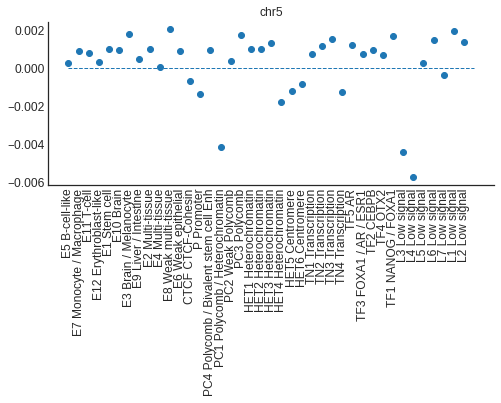

...

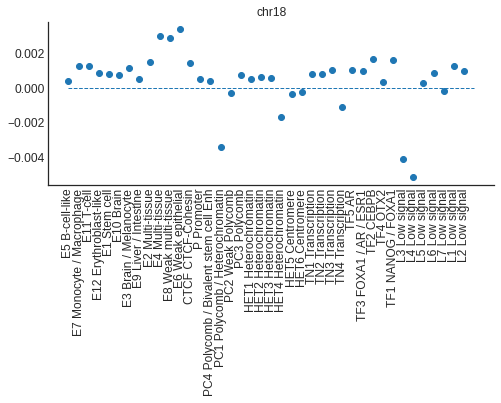

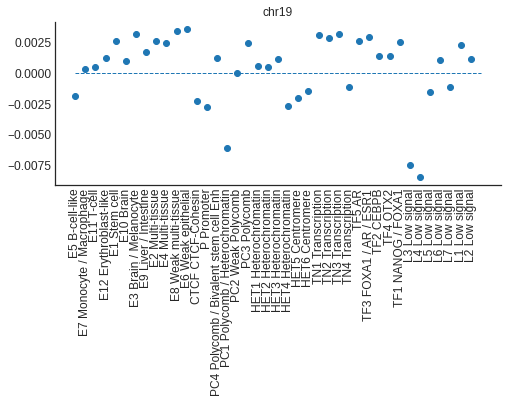

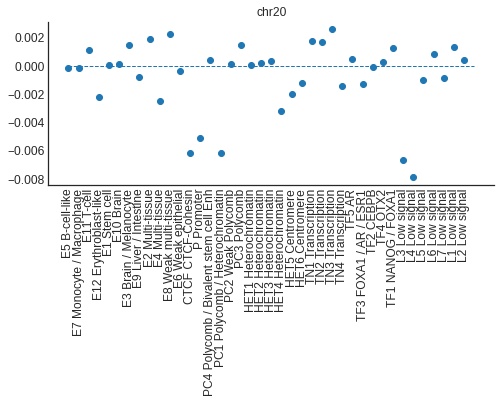

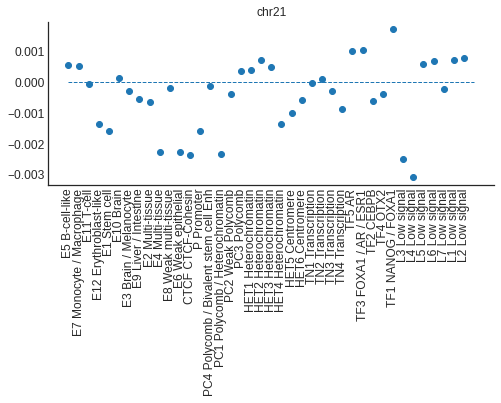

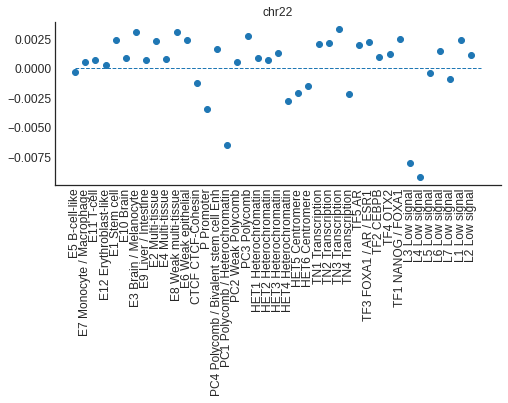

In [8]:
for chrom in df['chrom'].unique():
    subset_df = df[df['chrom'] == chrom]
    plt.figure(figsize=(8, 3))
    plt.scatter(
        list(range(len(subset_df))),
        subset_df[df.columns[-2]].values,)
    #plt.errorbar(
    #    list(range(len(subset_df))),
    #    subset_df[df.columns[-2]].values,
    #    subset_df[df.columns[-1]].values,
    #    linestyle='None', marker='o')
    plt.plot([0, 40], [0, 0], linestyle='--', linewidth=1)
    plt.title(chrom)
    plt.xticks(list(range(len(subset_df))),
               subset_df['sequence class'].values,
               rotation='vertical')
    plt.show()

In [9]:
PWD = '/mnt/ceph/users/kchen/noncoding_cancer_analysis/fine_mapping_brca/sei/sequence_class_scores'

In [10]:
sc_diffs = np.load(os.path.join(PWD, 'annot.variant_pos_ID_fine_mapping_breast_cancer.sequence_class.diffs.npy'))

In [11]:
rowlabels = pd.read_csv(
    os.path.join('/mnt/ceph/users/kchen/noncoding_cancer_analysis/fine_mapping_brca/sei', 'annot.variant_pos_ID_fine_mapping_breast_cancer_row_labels.txt'), 
    sep='\t')
rowlabels.head()

,chrom,pos,name,ref,alt,strand,ref_match,contains_unk
0,chr1,10043822,"chr_1_10043822_G_C,T",G,C,+,True,False
1,chr1,10043822,"chr_1_10043822_G_C,T",G,T,+,True,False
2,chr1,10043840,chr_1_10043840_G_T,G,T,+,True,False
3,chr1,10043905,chr_1_10043905_C_T,C,T,+,True,False
4,chr1,10043917,chr_1_10043917_A_G,A,G,+,True,False


In [12]:
ccvs = pd.read_csv('./Fachal_ST2_CCVs.csv')
ccvs.head()

,Variant_Id,Existing_variation,finemapping_region,Signal,Confidence_signal,chr,position,Ref,Alt,ERneg,ERpos,ERneutral,PP_ERneg,PP_ERpos,PP_ERall,PubmedID,Disease_Trait
0,1_10271688_C_G,rs11121529,chr1_10043820_11066215,Signal4,moderate,1,10271688,C,G,NaN,NaN,NaN,0.0,NaN,NaN,27863252,Mean platelet volume
1,1_10273179_C_T,rs997482,chr1_10043820_11066215,Signal4,moderate,1,10273179,C,T,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
2,1_10274560_CA_C,"rs1455587634,rs60073164",chr1_10043820_11066215,Signal4,moderate,1,10274560,CA,C,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
3,1_10280774_G_A,rs6702280,chr1_10043820_11066215,Signal4,moderate,1,10280774,G,A,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
4,1_10283187_G_GCC,rs140885528,chr1_10043820_11066215,Signal4,moderate,1,10283187,G,GCC,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN


In [35]:
ccv_set = {}
for row in ccvs.itertuples():
    ccv_set[(
        'chr{0}'.format(row.chr), row.position, row.Ref, row.Alt)] = row.Existing_variation


In [14]:
fm_regions = []
for r in ccvs['finemapping_region'].unique():
    chrom, s, e = r.split('_')
    fm_regions.append((chrom, int(s), int(e)))

In [15]:
fm_region_snps = defaultdict(list)
for ix, row in enumerate(rowlabels.itertuples()):
    for (chrom, s, e) in fm_regions:
        if row.chrom != chrom:
            continue
        if row.pos >= s and row.pos <= e:
            fm_region_snps[(chrom, s, e)].append(ix)
            break
    

In [16]:
total_snps = 0
for fm_region, ixlist in fm_region_snps.items():
    total_snps += len(ixlist)
    print(fm_region[2] - fm_region[1], len(ixlist))

1022395 11798
1000000 13399
1000000 10422
1000000 8095
1000000 9562
1000000 7900
1000000 10525
1000000 9551
1000000 10424
1057166 5055
1000000 4698
1014321 7119
1000000 8376
1000000 11727
1000000 7383
1000000 11918
1000000 8244
1000000 12595
1010365 13510
1000000 13171
1005012 10467
1000000 9151
1000000 11892
1000000 9338
1001446 11559
1596750 17539
1001986 11128
1000000 9247
1390676 16198
1000000 10776
1000000 13729
1457282 17194
1000000 12422
1014622 9218
1026203 11499
1000000 10271
1000000 11153
1000000 9397
1000000 11268
1000000 10784
1000000 11799
1000000 11479
1000000 10550
1287748 13111
1000000 12068
1018390 12212
845109 12049
1017698 14876
1000170 10705
1000000 11634
1193194 12256
1553448 16365
1055999 11644
1181508 13038
1109785 10796
1000000 9518
1000000 11911
1000000 10445
1014070 9906
1000000 11530
1009424 12280
1000000 11509
1000000 11630
1000000 9719
1003783 11994
1000000 13256
1167565 14321
1000000 11835
1000000 11241
1518160 17948
1000000 13795
1000000 11466
1050977 912

In [17]:
total_snps, len(rowlabels)

(1782919, 1817465)

In [18]:
fm_regions

[('chr1', 10043820, 11066215),
 ('chr1', 113948389, 114948389),
 ('chr1', 117730221, 118730221),
 ('chr1', 120723447, 121780613),
 ('chr1', 145144984, 146144984),
 ('chr1', 149406413, 150420734),
 ('chr1', 154648781, 155648781),
 ('chr1', 18307339, 19307339),
 ('chr1', 200937832, 201937832),
 ('chr1', 201687176, 202687176),
 ('chr1', 203301249, 204301249),
 ('chr1', 204018842, 205018842),
 ('chr1', 216720574, 217720574),
 ('chr1', 241523898, 242534263),
 ('chr1', 40880440, 41880440),
 ('chr1', 41637311, 42637311),
 ('chr1', 46100917, 47100917),
 ('chr1', 50346032, 51346032),
 ('chr1', 87656923, 88656923),
 ('chr10', 114273927, 115286154),
 ('chr10', 122593901, 123849324),
 ('chr10', 21532942, 22909392),
 ('chr10', 5386734, 6386735),
 ('chr10', 63758684, 65063702),
 ('chr10', 80341148, 81387721),
 ('chr10', 8588113, 9588113),
 ('chr10', 94792187, 95792187),
 ('chr11', 107845515, 108857137),
 ('chr11', 303017, 1303017),
 ('chr11', 128952507, 129961171),
 ('chr11', 1398664, 2442575),
 ('c

In [19]:
subset_diffs = sc_diffs[fm_region_snps[('chr10', 8588113, 9588113)]]
subset_diffs.shape

(11642, 61)

In [20]:
9588113 - 8588113

1000000

In [21]:
chrom = 'chr10'
start = 9080000
end = 9100000

In [34]:
sc_preds.columns

Index(['seqclass_max_absdiff', 'ref_match', 'contains_unk', 'chrom', 'pos',
       'id', 'ref', 'alt', 'strand', 'PC1 Polycomb / Heterochromatin',
       'L1 Low signal', 'TN1 Transcription', 'TN2 Transcription',
       'L2 Low signal', 'E1 Stem cell', 'E2 Multi-tissue',
       'E3 Brain / Melanocyte', 'L3 Low signal', 'E4 Multi-tissue',
       'TF1 NANOG / FOXA1', 'HET1 Heterochromatin', 'E5 B-cell-like',
       'E6 Weak epithelial', 'TF2 CEBPB', 'PC2 Weak Polycomb',
       'E7 Monocyte / Macrophage', 'E8 Weak multi-tissue', 'L4 Low signal',
       'TF3 FOXA1 / AR / ESR1', 'PC3 Polycomb', 'TN3 Transcription',
       'L5 Low signal', 'HET2 Heterochromatin', 'L6 Low signal', 'P Promoter',
       'E9 Liver / Intestine', 'CTCF CTCF-Cohesin', 'TN4 Transcription',
       'HET3 Heterochromatin', 'E10 Brain', 'TF4 OTX2', 'HET4 Heterochromatin',
       'L7 Low signal', 'PC4 Polycomb / Bivalent stem cell Enh',
       'HET5 Centromere', 'E11 T-cell', 'TF5 AR', 'E12 Erythroblast-like',
       'HE

In [77]:
tgt_region_snps = []
for ix, row in enumerate(rowlabels.itertuples()):
    if row.chrom != chrom:
        continue
    variant = (row.chrom, row.pos, row.ref, row.alt)
    if row.pos >= start and row.pos <= end:
        vid = '.'
        if variant in ccv_set:
            vid = ccv_set[variant]
        row = [np.max(np.abs(sc_diffs[ix][:40])), 
               True, False, row.chrom, row.pos,
               vid, row.ref, row.alt, '.']
        row += list(sc_diffs[ix][:40])
        tgt_region_snps.append(row)

In [23]:
1800000 // 150

12000

In [24]:
# check if the genome querying is correct
for (chrom, pos, ref, alt) in tgt_region_rowlabels:
    query = genome.get_sequence_from_coords(chrom, pos - 5, pos + 5)
    print(str.upper(query[4]), ref)

G G
C C
G G
T T
C C
C C
C C
T T
G G
G G
T T
T T
A A
C C
T T
A A
A A
T T
T T
A A
C C
T T
C C
G G
C C
A A
A A
T T
G G
A A
C C
G G
T T
G G
C C
C C
C C
C C
C C
T T
C C
G G
T T
T T
G G
C C
C C
G G
T T
C C
A A
T TAA
T TAA
T T
A A
G G
A A
A A
T T
A ATT
C CTATTT
T T
G G
G G
C C
C C
G G
T TAA
T TAA
C C
C C
G G
A AT
T T
A A
C C
A A
T T
A A
G G
C C
C C
T T
C C
T T
T T
C C
T T
T T
C C
A A
G G
C C
T TG
A A
G G
T T
T T
C C
A A
T T
G G
A A
C C
C C
A A
G G
C CATT
C C
G G
T T
A A
C C
A A
C C
T T
G G
T T
C C
T T
T T
T T
A A
T T
T T
G G
G G
G G
C C
T T
A A
C C
C C
A A
T T
C C
T TA
A A
T T
C C
C C
T T
C C
A A
A A
A A
T T
G G
T T
A A
C CATTAA
T T
A A
G GTAT
T TTATA
T TTATA
T TTATA
G G
C C
C C
T T
A A
C C
C C
G G
T T
T T
G G
C C
T T
C C
C C
G G
G G
G G
G G
A A
G G
A A
T TCCTTTCA
T T
T TA
T T
C C
C C
T T
G G
T T
T TTTC
T T
C CATG
A A
C C
T T
G G
G G
C CAGG
C C
T T
C CT
T TCATATTTTACTTTATATATATATATATATATATATATATATATATATATA
C C
T T
C C
T T
C C
G G
C C
T T
G G
T T
G G
A A
G G
C C
G G
C C
G GC
A A
G G
C C
A A
C 

In [26]:
pos_ixs = np.random.choice(list(range(start, end)), size=1000, replace=False)
pos_ixs[:10]

array([9083070, 9080586, 9093529, 9099584, 9083547, 9092162, 9091756,
       9094306, 9098951, 9089624])

In [27]:
build_vcf = []
for pos in pos_ixs:
    query = genome.get_sequence_from_coords(chrom, pos - 5, pos + 5)
    ref = str.upper(query[4])
    alt = np.random.choice(list(set(['A', 'C', 'T', 'G']) - set([ref])))
    build_vcf.append('{0}\t{1}\t{2}\t{3}\t{4}'.format(
        chrom, pos, '.', ref, alt))

In [28]:
with open(os.path.join('./summer_project/10q14.vcf'), 'w+') as fh:
    for line in build_vcf:
        fh.write(line + '\n')

In [29]:
sc_preds = pd.read_csv(os.path.join('./summer_project', 'sei', 'sequence_class_scores.tsv'), sep='\t')
sc_preds.head()

,seqclass_max_absdiff,ref_match,contains_unk,chrom,pos,id,ref,alt,strand,PC1 Polycomb / Heterochromatin,...,E10 Brain,TF4 OTX2,HET4 Heterochromatin,L7 Low signal,PC4 Polycomb / Bivalent stem cell Enh,HET5 Centromere,E11 T-cell,TF5 AR,E12 Erythroblast-like,HET6 Centromere
0,3.509700,True,False,chr10,9087508,.,G,C,.,0.130416,...,0.323512,0.418358,0.007863,-0.068756,0.187550,0.189584,0.636780,0.587445,0.743936,0.090673
1,3.422660,True,False,chr10,9080485,.,C,G,.,-0.025464,...,0.234679,0.328304,-0.323523,0.110557,0.102112,0.401743,1.434585,0.444236,1.033026,0.434774
2,3.309720,True,False,chr10,9091541,.,A,T,.,0.000516,...,0.132957,0.174008,-0.240527,-0.141129,0.091925,0.027476,0.355147,0.295870,0.443698,0.027706
3,2.482392,True,False,chr10,9087694,.,T,G,.,0.020434,...,0.021076,0.170324,0.050916,0.016669,0.040108,0.015747,0.068858,1.380489,0.101567,0.019009
4,2.064157,True,False,chr10,9080486,.,A,G,.,0.073915,...,0.170753,0.083170,-0.045056,-0.017899,0.067822,0.119391,0.285946,0.278046,0.384276,0.069756


In [78]:
combined_df = pd.concat([sc_preds, pd.DataFrame(tgt_region_snps, columns=sc_preds.columns)])
combined_df.head()

,seqclass_max_absdiff,ref_match,contains_unk,chrom,pos,id,ref,alt,strand,PC1 Polycomb / Heterochromatin,...,E10 Brain,TF4 OTX2,HET4 Heterochromatin,L7 Low signal,PC4 Polycomb / Bivalent stem cell Enh,HET5 Centromere,E11 T-cell,TF5 AR,E12 Erythroblast-like,HET6 Centromere
0,3.509700,True,False,chr10,9087508,.,G,C,.,0.130416,...,0.323512,0.418358,0.007863,-0.068756,0.187550,0.189584,0.636780,0.587445,0.743936,0.090673
1,3.422660,True,False,chr10,9080485,.,C,G,.,-0.025464,...,0.234679,0.328304,-0.323523,0.110557,0.102112,0.401743,1.434585,0.444236,1.033026,0.434774
2,3.309720,True,False,chr10,9091541,.,A,T,.,0.000516,...,0.132957,0.174008,-0.240527,-0.141129,0.091925,0.027476,0.355147,0.295870,0.443698,0.027706
3,2.482392,True,False,chr10,9087694,.,T,G,.,0.020434,...,0.021076,0.170324,0.050916,0.016669,0.040108,0.015747,0.068858,1.380489,0.101567,0.019009
4,2.064157,True,False,chr10,9080486,.,A,G,.,0.073915,...,0.170753,0.083170,-0.045056,-0.017899,0.067822,0.119391,0.285946,0.278046,0.384276,0.069756


In [79]:
combined_df.shape

(1236, 49)

In [80]:
combined_df['max_sc'] = np.argmax(np.abs(combined_df[combined_df.columns[9:]].values), axis=1)

In [81]:
combined_df.columns

Index(['seqclass_max_absdiff', 'ref_match', 'contains_unk', 'chrom', 'pos',
       'id', 'ref', 'alt', 'strand', 'PC1 Polycomb / Heterochromatin',
       'L1 Low signal', 'TN1 Transcription', 'TN2 Transcription',
       'L2 Low signal', 'E1 Stem cell', 'E2 Multi-tissue',
       'E3 Brain / Melanocyte', 'L3 Low signal', 'E4 Multi-tissue',
       'TF1 NANOG / FOXA1', 'HET1 Heterochromatin', 'E5 B-cell-like',
       'E6 Weak epithelial', 'TF2 CEBPB', 'PC2 Weak Polycomb',
       'E7 Monocyte / Macrophage', 'E8 Weak multi-tissue', 'L4 Low signal',
       'TF3 FOXA1 / AR / ESR1', 'PC3 Polycomb', 'TN3 Transcription',
       'L5 Low signal', 'HET2 Heterochromatin', 'L6 Low signal', 'P Promoter',
       'E9 Liver / Intestine', 'CTCF CTCF-Cohesin', 'TN4 Transcription',
       'HET3 Heterochromatin', 'E10 Brain', 'TF4 OTX2', 'HET4 Heterochromatin',
       'L7 Low signal', 'PC4 Polycomb / Bivalent stem cell Enh',
       'HET5 Centromere', 'E11 T-cell', 'TF5 AR', 'E12 Erythroblast-like',
       'HE

## Start here

In [82]:
SC_NAMES_FILE = '/mnt/ceph/users/jzhou/cistrome_manuscript/sei_manuscript/resources/cnames.tsv'
df = pd.read_csv(SC_NAMES_FILE, sep='\t')
df.head()
MAPPING = {}
for row in df.itertuples():
    MAPPING[row.index] = '{0} {1}'.format(row.ID, row.name)
color_map = {
    'E': "#984ef3",
    'CTCF': "#fdb462",
    'P': "#ef3b2c",
    'PC': "#8abad4",
    'HET': "#662506",
    'TN': "#fb9a99",
    'TF': "#386cb0",
    'L': "#C0C0C0"
}

def num_split(s):
    head = s.rstrip('0123456789')
    tail = s[len(head):]
    return head, tail

class_categories = defaultdict(list)
for c, label in MAPPING.items():
    classname = label.split(' ')[0]
    classtype, _ = num_split(classname)
    class_categories[classtype].append(c)
class_categories

defaultdict(list,
            {'E': [12, 16, 36, 38, 5, 30, 7, 26, 6, 9, 17, 13],
             'CTCF': [27],
             'P': [25],
             'PC': [34, 0, 15, 20],
             'HET': [11, 23, 29, 32, 35, 39],
             'TN': [2, 3, 21, 28],
             'TF': [37, 19, 14, 31, 10],
             'L': [8, 18, 22, 24, 33, 1, 4]})

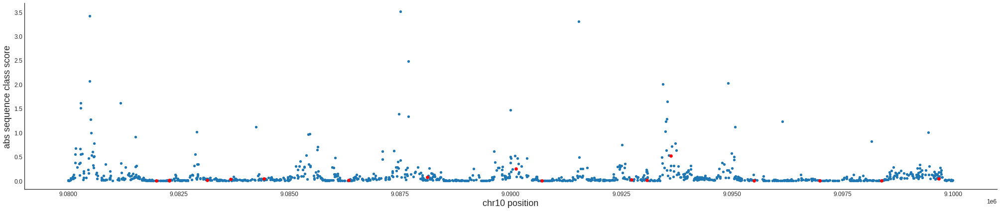

In [83]:
# TODO: color this based on what type of sequence class is max
PWD = './summer_project'
position_sorted = combined_df.sort_values(['pos'])
plt.figure(figsize=(28, 6))
plt.scatter(position_sorted['pos'][~position_sorted['id'].str.startswith('rs')],
            position_sorted['seqclass_max_absdiff'][~position_sorted['id'].str.startswith('rs')],
            s=18)
plt.scatter(position_sorted['pos'][position_sorted['id'].str.startswith('rs')],
            position_sorted['seqclass_max_absdiff'][position_sorted['id'].str.startswith('rs')],
            color='red', s=32)
plt.xlabel('chr10 position', fontsize=18)
plt.ylabel('abs sequence class score', fontsize=18)
plt.tight_layout()
plt.savefig(os.path.join(PWD, 'max_score_scatter.png'), dpi=300)

In [84]:
combined_df['id'].unique()

array(['.', 'rs17145120', 'rs72784410', 'rs72784411', 'rs56338257',
       'rs34217402', 'rs34195518', 'rs146435596',
       'rs112361679,rs67958007', 'rs68088353', 'rs17145151', 'rs34523755',
       'rs71374550', 'rs12765282', 'rs1573110', 'rs7085443', 'rs34953008',
       'rs67919502'], dtype=object)

In [85]:
position_sorted_data = position_sorted[position_sorted.columns[9:]].values
position_sorted.head()

,seqclass_max_absdiff,ref_match,contains_unk,chrom,pos,id,ref,alt,strand,PC1 Polycomb / Heterochromatin,...,TF4 OTX2,HET4 Heterochromatin,L7 Low signal,PC4 Polycomb / Bivalent stem cell Enh,HET5 Centromere,E11 T-cell,TF5 AR,E12 Erythroblast-like,HET6 Centromere,max_sc
838,0.006905,True,False,chr10,9080008,.,C,A,.,-0.000895,...,-0.001894,0.000679,0.001181,-0.001620,0.000497,-0.001080,-0.001548,-0.001074,0.000184,19
798,0.008880,True,False,chr10,9080009,.,T,A,.,0.001073,...,-0.001758,0.004182,0.002895,0.000195,0.000712,-0.000396,-0.001218,-0.000995,-0.000144,4
843,0.006798,True,False,chr10,9080016,.,A,C,.,-0.000119,...,-0.000076,-0.001593,-0.001331,0.000582,-0.000661,-0.000240,-0.000255,-0.000128,-0.000188,14
0,0.006396,True,False,chr10,9080026,.,G,C,.,0.000053,...,-0.000838,0.002173,0.001123,-0.001060,0.000290,-0.001160,-0.001536,-0.001004,-0.000209,4
684,0.014431,True,False,chr10,9080046,.,T,A,.,-0.000221,...,-0.002205,0.000935,0.000702,-0.000397,-0.000480,-0.001089,-0.002441,-0.001373,-0.000479,14


In [86]:
def scatter_plot_vis_maxonly(full_df, lines, line_ys):
    traces = []
    for sc in range(40):
        #print(sc)
        df = full_df[full_df['max_sc'] == sc]
        #print(df.head())
        traces.append(go.Scattergl(
            x=df['pos'], y=df['seqclass_max_absdiff'],
            marker=dict(size=[5 if 'rs' not in label else 6 for label in df['id']],
                        opacity=[0.5 if 'rs' not in label else 1 for label in df['id']], 
                        symbol=[100 if 'rs' not in label else 4 for label in df['id']],
                        line=dict(width=0.2,)),
            mode='markers',
            name=MAPPING[sc],
            text=['{0} (chr12, {1}, {2}/{3})<br />{4}: {5:.4f}'.format(
                row[1]['id'], row[1]['pos'],
                row[1]['ref'], row[1]['alt'], 
                MAPPING[row[1]['max_sc']], row[1]['seqclass_max_absdiff']) 
                  for row in df.iterrows()]
        ))
    
    for sc, xs in lines.items():
        traces.append(go.Scattergl(
            x=xs, y=line_ys[sc], #[-1] * len(xs),
            name=sc,
            marker=dict(size=1)
            #connectgaps=True
        ))
    
    
    fig = go.Figure(
        data=traces,
        layout=go.Layout(
            title=go.layout.Title(text="12q24 variant effects"),
            width = 1500,
            height = 750,
            hovermode='closest',
            xaxis=dict(showgrid=False, zeroline=False),
            yaxis=dict(showgrid=False, zeroline=False)
        )
    )
    #fig.update_traces(mode='lines+markers')
    fig.update_xaxes(title = "chr12")
    fig.update_yaxes(title = "sequence class score (variant effect)")
    print('saving', os.path.join('summer_project', "df_scatter.max.html"))
    fig.write_html(os.path.join('summer_project', "df_scatter.max.html"))

    fig.show()
    

In [87]:
lines = []
PWD = '/mnt/ceph/users/kchen/cistrome_analyses/make_figures'
with open(os.path.join(PWD, 'sorted.hg19.tiling.bed.ipca_randomized_300.labels.merged.bed'), 'r') as fh:
    for line in fh:
        cols = line.strip().split('\t')
        rchrom, rstart, rend, rsc = cols
        rstart = int(rstart)
        rend = int(rend)
        rsc = int(rsc)
        
        if rchrom != chrom:
            continue
        if rstart >= start and rstart <= end:
            lines.append((rchrom, rstart, rend, rsc))

sc_coordinates = defaultdict(list)
sc_ys = defaultdict(list)
for line in lines:
    if line[-1] in MAPPING:
        sc_coordinates[MAPPING[line[-1]]].append(line[1])
        sc_coordinates[MAPPING[line[-1]]].append(line[2])
        sc_coordinates[MAPPING[line[-1]]].append(line[2]+0.1)
        
        sc_ys[MAPPING[line[-1]]].append(-1)
        sc_ys[MAPPING[line[-1]]].append(-1)
        sc_ys[MAPPING[line[-1]]].append(None)


In [88]:
scatter_plot_vis_maxonly(combined_df, sc_coordinates, sc_ys)

saving summer_project/df_scatter.max.html


In [89]:
def scatter_plot_vis(df):
    traces = [go.Scattergl(
        x=df['pos'], y=df[MAPPING[sc]],
        marker=dict(size=[5 if 'rs' not in label else 6 for label in df['id']],
                    opacity=[0.5 if 'rs' not in label else 1 for label in df['id']], 
                    symbol=[100 if 'rs' not in label else 4 for label in df['id']],
                    line=dict(width=0.2,)),
        mode='markers',
        name=MAPPING[sc],
        text=['{0} (chr12, {1}, {2}/{3})<br />{4}: {5:.4f}'.format(
            row[1]['id'], row[1]['pos'],
            row[1]['ref'], row[1]['alt'], 
            MAPPING[sc], row[1][MAPPING[sc]]) for row in df[df.columns[:9].tolist() + [MAPPING[sc]]].iterrows()],
        hoverinfo="text",
    ) for sc in range(40)]
    
    fig = go.Figure(
        data=traces,
        layout=go.Layout(
            title=go.layout.Title(text="12q24 variant effects"),
            width = 2000,
            height = 1000,
            hovermode='closest',
            xaxis=dict(showgrid=False, zeroline=False),
            yaxis=dict(showgrid=False, zeroline=False)
        )
    )
    
    fig.update_xaxes(title = "chr12")
    fig.update_yaxes(title = "sequence class score (variant effect)")

    fig.show()
    
    fig.write_html(os.path.join('./summer_project', "df_scatter.html"))


In [90]:
scatter_plot_vis(position_sorted)

In [76]:
ccvs[ccvs['Existing_variation'] == 'rs12765282']

,Variant_Id,Existing_variation,finemapping_region,Signal,Confidence_signal,chr,position,Ref,Alt,ERneg,ERpos,ERneutral,PP_ERneg,PP_ERpos,PP_ERall,PubmedID,Disease_Trait
1419,10_9093623_C_A,rs12765282,chr10_8588113_9588113,Signal1,strong,10,9093623,C,A,NaN,NaN,1.0,NaN,NaN,0.15,NaN,NaN


In [91]:
position_sorted.shape, combined_df.shape

((1236, 50), (1236, 50))

In [93]:
position_sorted.to_csv('./summer_project/data.tsv', sep='\t', index=False)

In [92]:
position_sorted.head()

,seqclass_max_absdiff,ref_match,contains_unk,chrom,pos,id,ref,alt,strand,PC1 Polycomb / Heterochromatin,...,TF4 OTX2,HET4 Heterochromatin,L7 Low signal,PC4 Polycomb / Bivalent stem cell Enh,HET5 Centromere,E11 T-cell,TF5 AR,E12 Erythroblast-like,HET6 Centromere,max_sc
838,0.006905,True,False,chr10,9080008,.,C,A,.,-0.000895,...,-0.001894,0.000679,0.001181,-0.001620,0.000497,-0.001080,-0.001548,-0.001074,0.000184,19
798,0.008880,True,False,chr10,9080009,.,T,A,.,0.001073,...,-0.001758,0.004182,0.002895,0.000195,0.000712,-0.000396,-0.001218,-0.000995,-0.000144,4
843,0.006798,True,False,chr10,9080016,.,A,C,.,-0.000119,...,-0.000076,-0.001593,-0.001331,0.000582,-0.000661,-0.000240,-0.000255,-0.000128,-0.000188,14
0,0.006396,True,False,chr10,9080026,.,G,C,.,0.000053,...,-0.000838,0.002173,0.001123,-0.001060,0.000290,-0.001160,-0.001536,-0.001004,-0.000209,4
684,0.014431,True,False,chr10,9080046,.,T,A,.,-0.000221,...,-0.002205,0.000935,0.000702,-0.000397,-0.000480,-0.001089,-0.002441,-0.001373,-0.000479,14


In [94]:
import h5py
preds = h5py.File('./summer_project/sei_with_ccv/10q14_with_ccvs_diffs.h5', 'r')['data'][()]
preds.shape

(1236, 21907)

In [96]:
np.save('./summer_project/10q14_sei_preds.npy', preds)

TypeError: expected str, bytes or os.PathLike object, not numpy.ndarray